<h1> Eyes of Hajj </h1>
<h3>Hajj Crowd Abnormal Behavior Detection</h3>
<h3>Project Workflow</h3>
<ol>
    <li>Loading the HAJJv2 Dataset.</li>
    <li>Extracting the images (frames) from the videos and merge the labesls into a single file for train & test.</li>
    <li>Transforming the data to Yolo format where we optain a text file (label) for each image in train & test & val. </li>
    <li>Changeing the Yolo feature extractor's backbone to MobileNet/ResNet50 to optimize the feature extraction.</li>
    <li>Applaying the Lucas-Kanade algorithm on the frames (images) from the original dataset to estimate the optical flow (Magnitude & Orientation/Direction).</li>
    <li>Taking the mean & varience & STD of the optical flow and feed it into the Random Forest classifier to predect the actual class of the abnormal behavior.</li>
    <li>Using the Kalman filter with the RF predections to optimaize the Yolo's object tracking.</li>
    <li>Evaluating the models' performences on the testing data nad save the output in a new folder.</li>
</ol>

In [4]:
# Importing the required libraries

import pandas as pd
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import os
import cv2
import tqdm

In [5]:
# creating the video frames extraction function

def extract_frames_from_videos(video_path, output_folder):
    for i in [2, 3, 5, 7, 8, 9, 10, 11, 12]:
        video_file = os.path.join(video_path, f"{i}.mp4")
        cam = cv2.VideoCapture(video_file)

        try:
            # Creating a folder for extracted frames
            if not os.path.exists(output_folder):
                os.makedirs(output_folder)
        except OSError:
            print('Error: Creating directory for data')

        currentframe = 1

        total_frames = int(cam.get(cv2.CAP_PROP_FRAME_COUNT))
        with tqdm(total=total_frames) as pbar:
            while True:
                ret, frame = cam.read()

                if ret:
                    # If video is still left, continue creating images
                    name = os.path.join(output_folder, f'{i}_{currentframe}.jpg')
                    #print('Creating...' + name)

                    # Writing the extracted images
                    cv2.imwrite(name, frame)

                    currentframe += 1
                    pbar.update(1)
                else:
                    break

        # Release video and close windows once done
        cam.release()
        cv2.destroyAllWindows()

In [6]:
# creating the target csv files function
def concatenate_csv_files(directory, output_file):
    dfs = []

    for filename in os.listdir(directory):
        if filename.endswith(".csv"):
            file_path = os.path.join(directory, filename)
            df = pd.read_csv(file_path)
            dfs.append(df)

    concatenated_df = pd.concat(dfs, ignore_index=True)

    concatenated_df.to_csv(output_file, index=False)

In [7]:
# creating the the extracted frames (images) and labels combination into csv file function
def add_image_paths_to_dataframe(input_csv_file):
    train_df = pd.read_csv(input_csv_file)

    train_df['image_path'] = train_df.apply(
        lambda row: f"{row['Video_No']}_{row['Frame_No']}.jpg", axis=1
    )

    train_df.to_csv(input_csv_file, index=False)

    return train_df

### 1. Loading the HAJJv2 Dataset

### 2. Extracting the images (frames) from the videos and merge the labesls into a single file for train & test

In [8]:
# setting up the train videos paths

video_path = "HAJJv2_Dataset/Original_Data/Train/Videos"
output_folder = "HAJJv2_Dataset/Extracted_Data/Train"
extract_frames_from_videos(video_path, output_folder)

'\n# setting up the train videos paths\nvideo_path = "HAJJv2_Dataset/Training/Videos"\noutput_folder = "HAJJv2_Dataset/Extracted_Data/Train"\nextract_frames_from_videos(video_path, output_folder)\n'

In [9]:
# setting up the train labels paths

input_directory = 'HAJJv2_Dataset/Original_Data/Train/Labels/'
output_file = 'HAJJv2_Dataset/Extracted_Data/Train_Labels.csv'
concatenate_csv_files(input_directory, output_file)

"\n# setting up the train labels paths\ninput_directory = 'HAJJv2_Dataset/Training/Labels/'\noutput_file = 'HAJJv2_Dataset/Extracted_Data/Train_Labels.csv'\nconcatenate_csv_files(input_directory, output_file)\n"

In [10]:
# setting up the train video/label paths

input_csv_file = 'HAJJv2_Dataset/Extracted_Data/Train_Labels.csv'
train_df = add_image_paths_to_dataframe(input_csv_file)
train_df

"\n# setting up the train video/label paths\ninput_csv_file = 'HAJJv2_Dataset/Extracted_Data/Train_Labels.csv'\ntrain_df = add_image_paths_to_dataframe(input_csv_file)\ntrain_df\n"

In [11]:
# setting up the test videos paths

video_path = "HAJJv2_Dataset/Original_Data/Test/Videos"
output_folder = "HAJJv2_Dataset/Extracted_Data/Test"
extract_frames_from_videos(video_path, output_folder)

'\n# setting up the test videos paths\nvideo_path = "HAJJv2_Dataset/Testing/Videos"\noutput_folder = "HAJJv2_Dataset/Extracted_Data/Test"\nextract_frames_from_videos(video_path, output_folder)\n'

In [12]:
# setting up the test labels paths

input_directory = 'HAJJv2_Dataset/Original_Data/Test/Labels/'
output_file = 'HAJJv2_Dataset/Extracted_Data/Test_Labels.csv'
concatenate_csv_files(input_directory, output_file)

"\n# setting up the test labels paths\ninput_directory = 'HAJJv2_Dataset/Testing/Labels/'\noutput_file = 'HAJJv2_Dataset/Extracted_Data/Test_Labels.csv'\nconcatenate_csv_files(input_directory, output_file)\n"

In [13]:
# setting up the test video/label paths

input_csv_file = 'HAJJv2_Dataset/Extracted_Data/Test_Labels.csv'
test_df = add_image_paths_to_dataframe(input_csv_file)
test_df

"\n# setting up the test video/label paths\ninput_csv_file = 'HAJJv2_Dataset/Extracted_Data/Test_Labels.csv'\ntest_df = add_image_paths_to_dataframe(input_csv_file)\ntest_df\n"

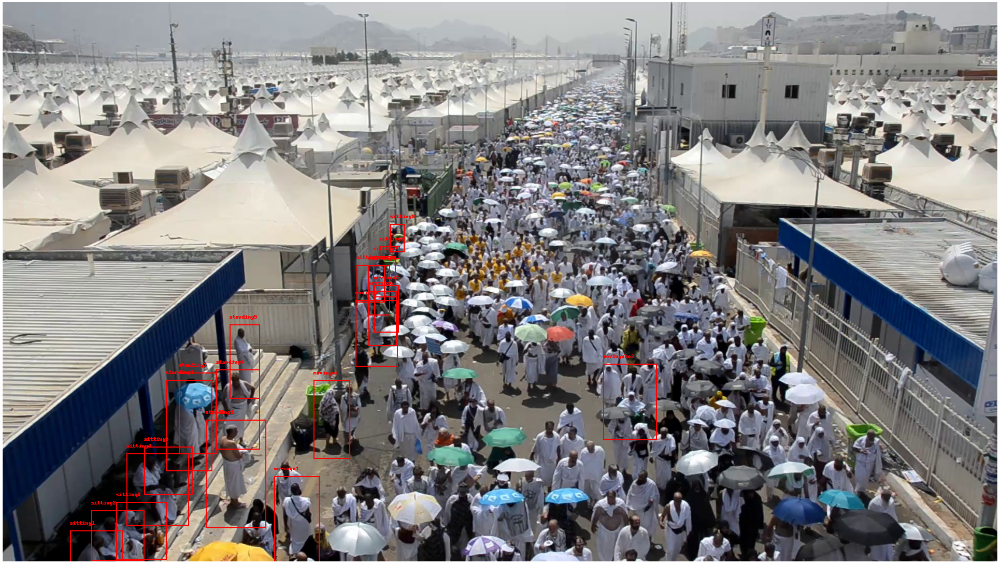

In [14]:
# Visualizing the images:

# Load the CSV file into a DataFrame
csv_file = 'HAJJv2_Dataset/Extracted_Data/Train_Labels.csv'  # The path to the CSV file
df = pd.read_csv(csv_file)

# The image that we want to visualize
selected_image_path = '10_1.jpg'

# Filter the DataFrame to select rows corresponding to the chosen image
selected_rows = df[df['image_path'] == selected_image_path]

# Load the chosen image
image_directory = 'HAJJv2_Dataset/Extracted_Data/Train/'  # The path to the images files
image_filename = os.path.join(image_directory, selected_image_path)

if os.path.exists(image_filename):
    image = Image.open(image_filename)
else:
    print(f"Image file not found: {image_filename}")
    exit()

# Create a drawing context on the image and draw the object names
draw = ImageDraw.Draw(image)

for index, row in selected_rows.iterrows():
    x = row['X']
    y = row['Y']
    width = row['Width']
    height = row['Height']

    # Define a bounding box using the annotation values
    bbox = [(x, y), (x + width, y + height)]

    # Draw a rectangle (bounding box) on the image
    draw.rectangle(bbox, outline="red", width=2)

    # Display the class or object name as text
    obj_name = row['Obj_Name']
    draw.text((x, y - 20), obj_name, fill="red")

# Show the image with object names
fig = plt.figure(figsize=(50, 50))
plt.imshow(image)
plt.axis('off')  # Turn off axis labels and ticks
plt.show()